<a href="https://colab.research.google.com/github/lrsilsbee/Analyses/blob/main/Lauren_Silsbee_Capstone_2_Hotel_Bookings.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import os
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import ensemble
from sklearn import svm, datasets
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score, classification_report
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, f_classif, chi2
from sklearn.linear_model import LogisticRegression
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC 
from sklearn import ensemble
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats.mstats import winsorize
import warnings
import scipy
import math
a=pd.Series([0, 1, np.nan, 3,4,5,7])
from sqlalchemy import create_engine
import matplotlib.pyplot as plt
from scipy.stats.mstats import winsorize
import warnings
import seaborn as sns
sns.set
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
%matplotlib inline
from sklearn.model_selection import GridSearchCV
import plotly.express as px
from sklearn.model_selection import train_test_split, KFold, cross_validate, cross_val_score
from tabulate import tabulate
import missingno as msno 
from IPython.display import display_html
from PIL import Image
import gc
import cv2
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import scipy
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
import plotly.express as px
import plotly.graph_objects as go
import datetime
from sklearn import model_selection
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from xgboost import plot_importance
from tensorflow import keras
from tensorflow.keras import layers
from sklearn import metrics
warnings.filterwarnings('ignore')
sns.set(style="whitegrid")

## Introduction

Have you ever wondered when the best time of year to book a hotel room is? Or the optimal length of stay in order to get the best daily rate? What if you wanted to predict whether or not a hotel was likely to receive a disproportionately high number of special requests?

This data set contains booking information for a city hotel and a resort hotel, and includes information such as when the booking was made, length of stay, the number of adults, children, and/or babies, and the number of available parking spaces, among other things. I will start by exploring the data in detail and will then fit with different supervised models (logistic regression, KNN, decision tree, random forest, SVC, and gradient boosting models) to determine whether the models can be used to accurately to predict if someone will cancel their hotel reservation from other variables.

The data was accessed from Kaggle (https://www.kaggle.com/jessemostipak/hotel-booking-demand) on November 27, 2020.

In [ ]:
#upload the data
from google.colab import files
files.upload()

Saving hotel_bookings.csv to hotel_bookings.csv


{'hotel_bookings.csv': b'hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date\nResort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,2015-07-01\nResort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,2015-07-01\nResort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NULL,NULL,0,Transient,75,0,0,Check-Out,2015-07-02\nResort Hotel,0,13,2015,July,27,1,0,1,1,

In [ ]:
#load dataset
hotel_df = pd.read_csv(r'hotel_bookings.csv')

## Explore and Clean the Data

In [ ]:
#take a look at the data shape
hotel_df.shape

(119390, 32)

In [ ]:
hotel_df.info

<bound method DataFrame.info of                hotel  is_canceled  ...  reservation_status  reservation_status_date
0       Resort Hotel            0  ...           Check-Out               2015-07-01
1       Resort Hotel            0  ...           Check-Out               2015-07-01
2       Resort Hotel            0  ...           Check-Out               2015-07-02
3       Resort Hotel            0  ...           Check-Out               2015-07-02
4       Resort Hotel            0  ...           Check-Out               2015-07-03
...              ...          ...  ...                 ...                      ...
119385    City Hotel            0  ...           Check-Out               2017-09-06
119386    City Hotel            0  ...           Check-Out               2017-09-07
119387    City Hotel            0  ...           Check-Out               2017-09-07
119388    City Hotel            0  ...           Check-Out               2017-09-07
119389    City Hotel            0  ...      

In [ ]:
hotel_df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
print("The variables are:")
print(hotel_df.columns.unique())
len(hotel_df.columns.unique())

The variables are:
Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')


32

In [ ]:
#check for missing values
hotel_df.isnull().sum()*100/hotel_df.isnull().count()

hotel                              0.000000
is_canceled                        0.000000
lead_time                          0.000000
arrival_date_year                  0.000000
arrival_date_month                 0.000000
arrival_date_week_number           0.000000
arrival_date_day_of_month          0.000000
stays_in_weekend_nights            0.000000
stays_in_week_nights               0.000000
adults                             0.000000
children                           0.003350
babies                             0.000000
meal                               0.000000
country                            0.408744
market_segment                     0.000000
distribution_channel               0.000000
is_repeated_guest                  0.000000
previous_cancellations             0.000000
previous_bookings_not_canceled     0.000000
reserved_room_type                 0.000000
assigned_room_type                 0.000000
booking_changes                    0.000000
deposit_type                    

In [ ]:
# check for missing values
nulls = hotel_df.isnull().sum()
nulls[nulls > 0]
#currently only 4 columns has missing values

children         4
country        488
agent        16340
company     112593
dtype: int64

In [ ]:
hotel_df.isnull()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
119386,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
119387,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
119388,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False


In [ ]:
hotel_df = hotel_df.replace('Undefined', np.NaN)
# there are few coloumns have Undefined value instead of NaN,
#replace 'Undefined' to NaN in the dataframe

In [ ]:
#calculate the total missing values across the whole dataset
hotel_df.isnull().sum().sum()/(len(hotel_df.index)*31)

0.03528717215739147

The data shows that there are 119390 rows with 32 variables, and four of the variables have missing values. Let's now look deeper into these four columns and see how many values are missing.

## Data Preprocessing for missing values

In [ ]:
percentage = hotel_df.isnull().sum()/ len(hotel_df)
percentage.sort_values(ascending=False).head()

company                 0.943069
agent                   0.136862
meal                    0.009791
country                 0.004087
distribution_channel    0.000042
dtype: float64

Company has 94.4% missing values, not helpful, drop the column.

In [ ]:
hotel_df.drop(['company'], axis=1, inplace=True)

Reservation_status_date could vary the data a lot, so we should drop. Reservation_status includes 'Canceled' feature. By keeping reservation_status in data, it is possible to achieve 100% accuracy rate because that feature is direct way to predict cancellations. Just in case, drop the reservation_status column.

In [ ]:
hotel_df.drop(['reservation_status_date'], axis=1, inplace=True)  

hotel_df.drop(['reservation_status'], axis=1, inplace=True)

Drop any remaining null values.

In [ ]:
hotel_df = hotel_df.dropna()

Check for missing values again.

In [ ]:
hotel_df.isnull().sum()*100/hotel_df.isnull().count()

hotel                             0.0
is_canceled                       0.0
lead_time                         0.0
arrival_date_year                 0.0
arrival_date_month                0.0
arrival_date_week_number          0.0
arrival_date_day_of_month         0.0
stays_in_weekend_nights           0.0
stays_in_week_nights              0.0
adults                            0.0
children                          0.0
babies                            0.0
meal                              0.0
country                           0.0
market_segment                    0.0
distribution_channel              0.0
is_repeated_guest                 0.0
previous_cancellations            0.0
previous_bookings_not_canceled    0.0
reserved_room_type                0.0
assigned_room_type                0.0
booking_changes                   0.0
deposit_type                      0.0
agent                             0.0
days_in_waiting_list              0.0
customer_type                     0.0
adr         

The missing values have been addressed.

 Inspect all the unqiue values in the columns  for replacing the missing values.

In [ ]:
#transform column to binary value
hotel_df['hotel'] = hotel_df['hotel'].map({'Resort Hotel':0, 'City Hotel':1}).astype(int)

hotel_df['arrival_date_month'] = hotel_df['arrival_date_month'].map({'January':1, 'February': 2, 'March':3, 'April':4, 'May':5, 'June':6, 'July':7,
                                                            'August':8, 'September':9, 'October':10, 'November':11, 'December':12}).astype(int)

The country column has a high variety of data, so we need to transfer from objects to numerical data. Transfer to categorical data first, then transfer to numeric data.

In [ ]:
hotel_df['country'] = hotel_df['country'].astype('category')
hotel_df['country'] = hotel_df['country'].cat.codes

In [ ]:
#take another look at the data again
hotel_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102064 entries, 3 to 119389
Data columns (total 29 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           102064 non-null  int64  
 1   is_canceled                     102064 non-null  int64  
 2   lead_time                       102064 non-null  int64  
 3   arrival_date_year               102064 non-null  int64  
 4   arrival_date_month              102064 non-null  int64  
 5   arrival_date_week_number        102064 non-null  int64  
 6   arrival_date_day_of_month       102064 non-null  int64  
 7   stays_in_weekend_nights         102064 non-null  int64  
 8   stays_in_week_nights            102064 non-null  int64  
 9   adults                          102064 non-null  int64  
 10  children                        102064 non-null  float64
 11  babies                          102064 non-null  int64  
 12  meal            

Ther are now far less objects than when we started.

Let's rename and combine some of the features. 

In [ ]:
# create new columns: 'is_family' , 'deposit_given', 'total_nights'
def family_check(hotel_df):
    if ((hotel_df['adults'] > 0) & (hotel_df['children'] > 0)):
        val = 1
    elif ((hotel_df['adults'] > 0) & (hotel_df['babies'] > 0)):
        val = 1
    else:
        val = 0
    return val

def deposit(hotel_df):
    if ((hotel_df['deposit_type'] == 'No Deposit') | (hotel_df['deposit_type'] == 'Refundable')):
        return 0
    else:
        return 1
    
def previous_cancellations_check(hotel_df):
    if hotel_df['previous_cancellations'] == 0:
        return 0
    else:
        return 1
    
def previous_bookings_not_canceled_check(hotel_df):
    if hotel_df['previous_bookings_not_canceled'] == 0:
        return 1
    else:
        return 0    
    
def booking_changed_check(hotel_df):
    if hotel_df['booking_changes'] == 0:
        return 0
    else:
        return 1    
    
def feature(hotel_df):
    # create new column 'is_family' based on 'adults', 'children', 'babies'
    hotel_df['is_family'] = hotel_df.apply(family_check, axis = 1)
    
    # create new column 'deposit_given' base on 'deposit_type'
    hotel_df['deposit_given'] = hotel_df.apply(deposit, axis=1)
    hotel_df['previous_cancelled'] = hotel_df.apply(previous_cancellations_check, axis=1)
    hotel_df['previous_bookings_not_canceled_check'] = hotel_df.apply(previous_bookings_not_canceled_check, axis=1)
    hotel_df['booking_changed'] = hotel_df.apply(booking_changed_check, axis=1)
   
    # create new column 'total_nights' based on 'stays_in_weekend_nights' and 'stays_in_week_nights'
    hotel_df['total_nights'] = hotel_df['stays_in_weekend_nights'] + hotel_df['stays_in_week_nights']
    hotel_df['booking_times'] = hotel_df['previous_cancellations'] + hotel_df['previous_bookings_not_canceled']
    return hotel_df

hotel_df = feature(hotel_df)

In [ ]:
# since we created a 'deposit_given' column from 'deposit_type', we can drop 'deposit_type, and so on'
hotel_df.drop(['deposit_type'], axis=1, inplace=True)
hotel_df.drop(['previous_cancellations'], axis=1, inplace=True)
hotel_df.drop(['previous_bookings_not_canceled'], axis=1, inplace=True)
hotel_df.drop(['booking_changed'], axis=1, inplace=True)

Check the correlation in the dataset with is_canceled.

In [ ]:
corr_matrix = hotel_df.corr()
corr_matrix['is_canceled'].sort_values(ascending=False)

is_canceled                             1.000000
deposit_given                           0.460740
country                                 0.295191
previous_cancelled                      0.290006
lead_time                               0.278742
hotel                                   0.114751
booking_times                           0.077117
previous_bookings_not_canceled_check    0.074994
days_in_waiting_list                    0.056020
adults                                  0.036479
adr                                     0.023393
arrival_date_month                      0.008866
stays_in_week_nights                    0.006806
arrival_date_week_number                0.006469
children                                0.005147
arrival_date_year                       0.004027
total_nights                           -0.003762
arrival_date_day_of_month              -0.006036
is_family                              -0.012439
stays_in_weekend_nights                -0.022452
is_repeated_guest   

Correlation heatmap of the data.

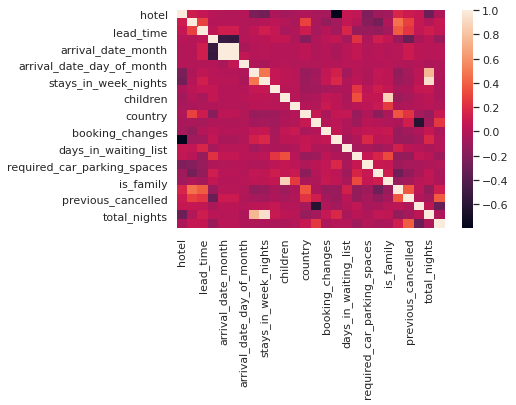

In [ ]:
sns.heatmap(hotel_df.corr())

We can see that arrival_date_month, arrival_date_week_number, arrival_date_year children, stays_in_week_nights, arrival_date_day_of_month, and total_nights have very low correlation(< 0.01%) with 'is_cancelled', whcih is not significant. It is best to drop these columns for further model prediction. We'll now drop the colomns with low correlation(< 0.01%).


In [ ]:
hotel_df.drop(['arrival_date_month','arrival_date_week_number',
          'stays_in_week_nights','children','arrival_date_year','total_nights',
        'arrival_date_day_of_month'], axis=1, inplace=True)

In [ ]:
#create list of the numeric columns
numeric_columns = hotel_df.select_dtypes(['int64', 'float64']).columns
print(numeric_columns)

Index(['agent', 'adr'], dtype='object')


Let's chart visualization of the numeric columns in the dataset. 

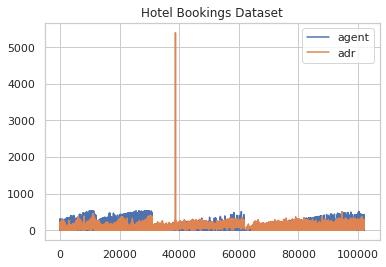

In [ ]:
# get columns to plot
columns = hotel_df.select_dtypes(['int64', 'float64']).columns
# create x data
x_data = range(0, hotel_df.shape[0])
# create figure and axis
fig, ax = plt.subplots()
# plot each column
for column in columns:
    ax.plot(x_data, hotel_df[column], label=column)
# set title and legend
ax.set_title('Hotel Bookings Dataset')
ax.legend()

In [ ]:
#create list of non-numeric columns
non_numeric_columns = hotel_df.select_dtypes(['object']).columns

print(non_numeric_columns)

Index(['meal', 'market_segment', 'distribution_channel', 'reserved_room_type',
       'assigned_room_type', 'customer_type'],
      dtype='object')


In [ ]:
#take another look at the data again

hotel_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 102064 entries, 3 to 119389
Data columns (total 25 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   hotel                                 102064 non-null  int64  
 1   is_canceled                           102064 non-null  int64  
 2   lead_time                             102064 non-null  int64  
 3   stays_in_weekend_nights               102064 non-null  int64  
 4   adults                                102064 non-null  int64  
 5   babies                                102064 non-null  int64  
 6   meal                                  102064 non-null  object 
 7   country                               102064 non-null  int16  
 8   market_segment                        102064 non-null  object 
 9   distribution_channel                  102064 non-null  object 
 10  is_repeated_guest                     102064 non-null  int64  
 11  

Visualize all features types.

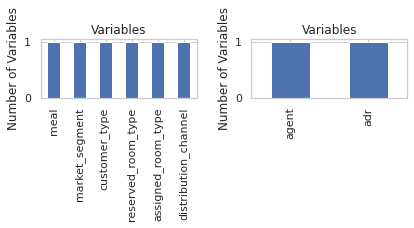

In [ ]:
#plot value counts
plt.subplot(2,2,1)
hotel_df.select_dtypes(['object']).columns.value_counts().plot(kind='bar')
plt.title('Variables')
plt.ylabel('Number of Variables')

plt.subplot(2,2,2)
hotel_df.select_dtypes(['int64', 'float64']).columns.value_counts().plot(kind='bar')
plt.title('Variables')
plt.ylabel('Number of Variables')

plt.tight_layout()
plt.show()

In [ ]:
# get descriptive stats for numeric columns
hotel_df.describe()

,hotel,is_canceled,lead_time,stays_in_weekend_nights,adults,babies,country,is_repeated_guest,booking_changes,agent,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,is_family,deposit_given,previous_cancelled,previous_bookings_not_canceled_check,booking_times
count,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000
mean,0.697415,0.391274,111.966384,0.976466,1.899779,0.007623,89.347439,0.013893,0.200796,85.420031,2.567732,104.794787,0.053173,0.608755,0.081008,0.121590,0.053731,0.990359,0.101701
std,0.459379,0.488038,107.910821,1.002527,0.491642,0.096786,44.172725,0.117049,0.624706,109.527488,18.676237,49.989400,0.225641,0.800297,0.272849,0.326814,0.225487,0.097715,0.912612
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,-6.380000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,26.000000,0.000000,2.000000,0.000000,51.000000,0.000000,0.000000,9.000000,0.000000,73.067500,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,1.000000,0.000000,79.000000,1.000000,2.000000,0.000000,80.000000,0.000000,0.000000,14.000000,0.000000,96.300000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,1.000000,1.000000,169.000000,2.000000,2.000000,0.000000,134.000000,0.000000,0.000000,229.000000,0.000000,128.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,629.000000,16.000000,26.000000,10.000000,173.000000,1.000000,18.000000,535.000000,391.000000,5400.000000,3.000000,5.000000,1.000000,1.000000,1.000000,1.000000,55.000000


In [ ]:
#get ouliers for numeric columns using tukey's method
for col in numeric_columns:
    q75, q25 = np.percentile(hotel_df[col], [75 ,25])
    iqr = q75 - q25


    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)

    print("The number of outliers for {} is: {}. This is {} percent of the column.".format(col, len((np.where((hotel_df[col] > max_val) 
                      | (hotel_df[col] < min_val))[0])), len((np.where((hotel_df[col] > max_val) | 
                                                    (hotel_df[col] < min_val))[0]))*100/1987))

The number of outliers for agent is: 0. This is 0.0 percent of the column.
The number of outliers for adr is: 3481. This is 175.18872672370406 percent of the column.


Only two features in the table contain outliers. 

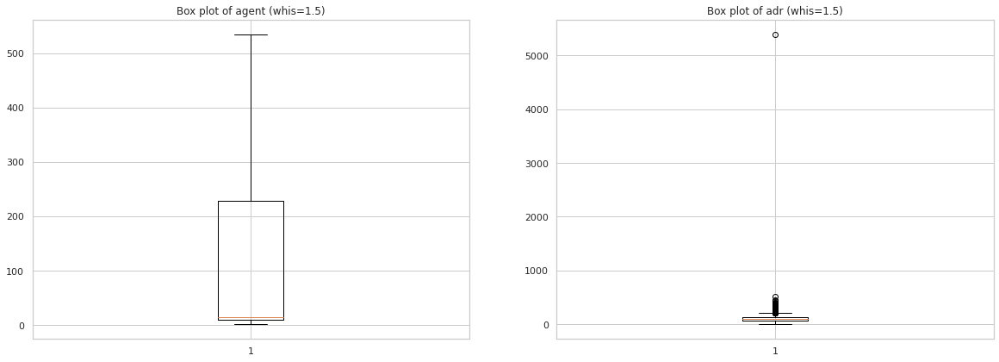

In [ ]:
#visualize the outliers

plt.figure(figsize=(20,15))

plt.subplot(2, 2, 1)
plt.boxplot(hotel_df["agent"])
plt.title("Box plot of agent (whis=1.5)")


plt.subplot(2, 2, 2)
plt.boxplot(hotel_df["adr"])
plt.title("Box plot of adr (whis=1.5)")

plt.show()

I do not think that the adr variable should be winsorized. I think we would lose a lot of information if we winsorized the variables that have a high percentage of outliers. The fact that the were so little outliers in these variables at the start of the dataset (precleaned) makes me think those outliers contain important information and we should keep them.

Let's visually explore how the categorical variables relate to the target variable is_canceled. First, it is necessary to convert the categorical variable is_canceled to a numeric one.

In [ ]:
#see how is_canceled is distributed
hotel_df['is_canceled'].value_counts()

0    62129
1    39935
Name: is_canceled, dtype: int64

KEY: No = 0  Yes = 1


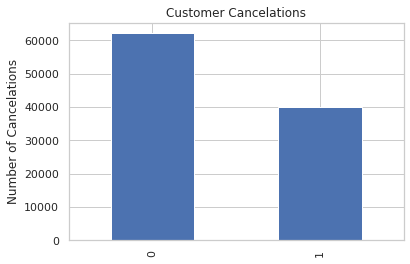

In [ ]:
#plot value counts
hotel_df['is_canceled'].value_counts().plot(kind='bar')
plt.title('Customer Cancelations')
plt.ylabel('Number of Cancelations')

print('KEY: No = 0  Yes = 1')

plt.show()

We can see here that of the customers that booked a reservation, 39,935 canceled and 62,129 did not cancel (a difference of 22,194). 

Now let's plot remaining categorical variables against cancelations. 

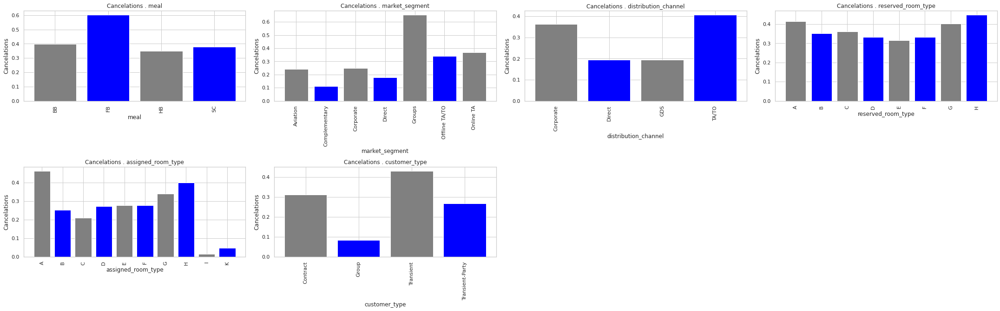

In [ ]:
plt.figure(figsize=(30,50))

for index, column in enumerate(non_numeric_columns):
    plt.subplot(11,4,index+1)
    plt.bar(hotel_df.groupby(column)["is_canceled"].mean().index, hotel_df.groupby(column)["is_canceled"].mean(),
           color=("grey","blue"))
    plt.title("Cancelations . {}".format(column))
    plt.ylabel("Cancelations")
    plt.xlabel(column)
    plt.xticks(rotation='vertical')

plt.tight_layout()
plt.show()

## Data Prep

In [ ]:
# create dummy values
hotel_df = pd.get_dummies(data = hotel_df, columns = ['meal', 'market_segment', 'distribution_channel',
                                            'reserved_room_type', 'assigned_room_type', 'customer_type'])

In [ ]:
#inspect data
hotel_df.shape
hotel_df.describe()

,hotel,is_canceled,lead_time,stays_in_weekend_nights,adults,babies,country,is_repeated_guest,agent,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests,is_family,deposit_given,previous_cancelled,previous_bookings_not_canceled_check,booking_changed,booking_times,meal_BB,meal_FB,meal_HB,meal_SC,market_segment_Aviation,market_segment_Complementary,market_segment_Corporate,market_segment_Direct,market_segment_Groups,market_segment_Offline TA/TO,market_segment_Online TA,distribution_channel_Corporate,distribution_channel_Direct,distribution_channel_GDS,distribution_channel_TA/TO,reserved_room_type_A,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,assigned_room_type_A,assigned_room_type_B,assigned_room_type_C,assigned_room_type_D,assigned_room_type_E,assigned_room_type_F,assigned_room_type_G,assigned_room_type_H,assigned_room_type_I,assigned_room_type_K,customer_type_Contract,customer_type_Group,customer_type_Transient,customer_type_Transient-Party
count,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.00000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000,102064.000000
mean,0.697415,0.391274,111.966384,0.976466,1.899779,0.007623,89.347439,0.013893,85.420031,2.567732,104.794787,0.053173,0.608755,0.081008,0.121590,0.053731,0.990359,0.137551,0.101701,0.760680,0.006574,0.131496,0.101250,0.000245,0.00097,0.006780,0.063960,0.148289,0.230679,0.549077,0.011022,0.067791,0.001871,0.919315,0.710828,0.009719,0.007309,0.171373,0.053133,0.024769,0.017636,0.005232,0.625941,0.018381,0.017558,0.214268,0.061442,0.030520,0.021153,0.005888,0.002665,0.002185,0.039661,0.004625,0.758661,0.197053
std,0.459379,0.488038,107.910821,1.002527,0.491642,0.096786,44.172725,0.117049,109.527488,18.676237,49.989400,0.225641,0.800297,0.272849,0.326814,0.225487,0.097715,0.344430,0.912612,0.426671,0.080816,0.337944,0.301661,0.015649,0.03113,0.082062,0.244683,0.355388,0.421269,0.497588,0.104408,0.251388,0.043219,0.272352,0.453380,0.098107,0.085181,0.376836,0.224300,0.155420,0.131625,0.072144,0.483881,0.134324,0.131337,0.410315,0.240140,0.172014,0.143896,0.076510,0.051555,0.046692,0.195163,0.067847,0.427897,0.397775
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,-6.380000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,26.000000,0.000000,2.000000,0.000000,51.000000,0.000000,9.000000,0.000000,73.067500,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,1.000000,0.000000,79.000000,1.000000,2.000000,0.000000,80.000000,0.000000,14.00

## Data Preprocessing for ML Models

In [ ]:
# feature set and target set
X = hotel_df.drop('is_canceled', axis = 1)
y = hotel_df['is_canceled']

In [ ]:
# split into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)

Data Scaling


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# Classification

KNN Classification

The training set score and test set scores are close, the highest test set score among all models is better.

In [ ]:
#GridsearchCV and cross validation searching for KNN hypterparameter
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
param_grid = {'n_neighbors': np.arange(1, 11)}
knn = KNeighborsClassifier()
knn_cv = GridSearchCV(knn, param_grid, cv=5,return_train_score = False,n_jobs = -1)# return_train_score = True,
knn_cv.fit(X_train, y_train)
knn_cv.best_params_

{'n_neighbors': 6}

In [ ]:
import pandas as pd
knn_cv_result = pd.DataFrame(knn_cv.cv_results_)
knn_cv_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,4.857698,0.416649,45.394848,2.085303,1,{'n_neighbors': 1},0.819268,0.819987,0.822142,0.817232,0.825985,0.820923,0.002978,10
1,4.524154,0.363310,54.742594,3.123288,2,{'n_neighbors': 2},0.824233,0.823449,0.824951,0.821216,0.825723,0.823914,0.001546,9
2,4.637509,0.381495,62.029347,3.932829,3,{'n_neighbors': 3},0.825343,0.820575,0.825278,0.823503,0.828075,0.824555,0.002469,8
3,4.522647,0.361860,62.350857,2.596880,4,{'n_neighbors': 4},0.826519,0.826061,0.828739,0.827879,0.830165,0.827873,0.001491,4
4,4.517923,0.377835,64.629104,2.917988,5,{'n_neighbors': 5},0.825800,0.823187,0.826780,0.825462,0.830949,0.826436,0.002545,7


In [ ]:
#k=6 is the best hyperparameter, applied this value in the model
clf = KNeighborsClassifier(n_neighbors=6,n_jobs = -1)
clf.fit(X_train, y_train)
print("Training set score: {:.3f}".format(clf.score(X_train, y_train)))
print("Test set accuracy: {:.3f}".format(clf.score(X_test, y_test)))
print("Best parameters: {}".format(knn_cv.best_params_))
print("Best cross-validation score: {:.4f}".format(knn_cv.best_score_))

Training set score: 0.873
Test set accuracy: 0.835
Best parameters: {'n_neighbors': 6}
Best cross-validation score: 0.8286


Logistic Regression

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
grid={"C":[0.001, 0.01, 0.1, 1, 10, 100, 1000], "penalty":["l1","l2"]}# l1 lasso l2 ridge
logreg=LogisticRegression(solver='liblinear')
logreg_cv=GridSearchCV(logreg,grid,cv=5,return_train_score = False ,n_jobs = -1)
logreg_cv.fit(X_train,y_train)
logreg_cv.best_params_

{'C': 10, 'penalty': 'l1'}

In [ ]:
import pandas as pd
logreg_cv_result = pd.DataFrame(logreg_cv.cv_results_)
logreg_cv_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.282527,0.030581,0.004676,0.000455,0.001,l1,"{'C': 0.001, 'penalty': 'l1'}",0.728021,0.729066,0.732528,0.731269,0.726370,0.729451,0.002212,14
1,0.364728,0.021341,0.004887,0.000535,0.001,l2,"{'C': 0.001, 'penalty': 'l2'}",0.750033,0.753886,0.751927,0.753152,0.748841,0.751568,0.001887,13
2,2.321724,0.184363,0.004706,0.000336,0.01,l1,"{'C': 0.01, 'penalty': 'l1'}",0.787394,0.788178,0.781319,0.787119,0.788033,0.786409,0.002575,11
3,0.600684,0.050695,0.005023,0.000042,0.01,l2,"{'C': 0.01, 'penalty': 'l2'}",0.782299,0.781973,0.777792,0.780260,0.781305,0.780726,0.001624,12
4,35.599469,2.246877,0.005352,0.000404,0.1,l1,"{'C': 0.1, 'penalty': 'l1'}",0.792946,0.792423,0.787133,0.792214,0.793520,0.791647,0.002302,9


In [ ]:
#use best parameter C value 
logreg1 = LogisticRegression(C=10, penalty = 'l1',solver='liblinear',random_state=0).fit(X_train, y_train)
print("Training set score: {:.3f}".format(logreg1.score(X_train, y_train)))
print("Test set score: {:.3f}".format(logreg1.score(X_test, y_test)))
print("Best parameters: {}".format(logreg_cv.best_params_))
print("Best cross-validation score: {:.4f}".format(logreg_cv.best_score_))

Training set score: 0.794
Test set score: 0.796
Best parameters: {'C': 10, 'penalty': 'l1'}
Best cross-validation score: 0.7935


Linear Support Vector Machine

In [ ]:
#select best hyperparameter #slow
from sklearn.model_selection import GridSearchCV
from sklearn.svm import LinearSVC
Cs = [0.1, 1, 10, 100]
param_grid = {'C': Cs}
linearSVC = GridSearchCV(LinearSVC(max_iter=500000), param_grid, cv=5,return_train_score = False,n_jobs = -1)
linearSVC.fit(X_train, y_train)
linearSVC.best_params_

{'C': 10}

In [ ]:
import pandas as pd
linearSVC_result = pd.DataFrame(linearSVC.cv_results_)
linearSVC_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.943498,0.025538,0.005761,0.002467,0.1,{'C': 0.1},0.793076,0.792750,0.787133,0.790319,0.793194,0.791294,0.002331,4
1,5.494098,0.226640,0.005619,0.002063,1,{'C': 1},0.796277,0.794187,0.788047,0.792475,0.794239,0.793045,0.002774,3
2,54.679924,9.724865,0.004894,0.000248,10,{'C': 10},0.796081,0.794252,0.788439,0.792998,0.794173,0.793189,0.002571,1
3,453.203116,60.066127,0.005048,0.000270,100,{'C': 100},0.796081,0.794252,0.788243,0.793194,0.794108,0.793176,0.002638,2


In [ ]:
#use best parameter C value 
svm = LinearSVC(C=10).fit(X_train, y_train)
print("Training set score: {:.3f}".format(svm.score(X_train, y_train)))
print("Test set score: {:.3f}".format(svm.score(X_test, y_test)))
print("Best parameters: {}".format(linearSVC.best_params_))
print("Best cross-validation score: {:.4f}".format(linearSVC.best_score_))

Training set score: 0.793
Test set score: 0.794
Best parameters: {'C': 10}
Best cross-validation score: 0.7932


Kernelized Support Vector Machine (rbf, poly, and linear)

In [ ]:
#linear hyperparameter selection 
from sklearn.svm import SVC
Cs = [0.01, 0.1, 1, 10, 100]
param_grid = {'C': Cs}
kernel_lin = GridSearchCV(SVC(kernel='linear'), param_grid, cv=5,return_train_score = False,n_jobs = -1)
kernel_lin.fit(X_train, y_train)
print("The best classifier is: ", kernel_lin.best_params_)

The best classifier is:  {'C': 100}


In [ ]:
import pandas as pd
kernel_lin_result = pd.DataFrame(kernel_lin.cv_results_)
kernel_lin_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,385.921409,5.387272,48.451682,1.239800,0.01,{'C': 0.01},0.752449,0.758981,0.763423,0.760468,0.751715,0.757407,0.004583,5
1,373.805845,5.427433,44.702824,0.188702,0.1,{'C': 0.1},0.793468,0.793534,0.785957,0.792606,0.791169,0.791347,0.002827,4
2,376.193448,9.896492,41.057949,0.521730,1,{'C': 1},0.796799,0.797779,0.790202,0.795153,0.796198,0.795227,0.002653,3
3,505.605610,5.042473,40.579746,0.339446,10,{'C': 10},0.798563,0.798302,0.789941,0.796590,0.797047,0.796089,0.003162,2
4,1326.812353,169.585472,37.789299,5.241944,100,{'C': 100},0.798628,0.797779,0.789615,0.797505,0.797374,0.796180,0.003312,1


In [ ]:
#use best parameter C value 
svc = SVC(kernel='linear', C=100,gamma='auto').fit(X_train, y_train)
print("Training set score: {:.3f}".format(svc.score(X_train, y_train)))
print("Test set score: {:.3f}".format(svc.score(X_test, y_test)))
print("Best parameters: {}".format(kernel_lin.best_params_))
print("Best cross-validation score: {:.4f}".format(kernel_lin.best_score_))

Training set score: 0.797
Test set score: 0.799
Best parameters: {'C': 100}
Best cross-validation score: 0.7962


In [ ]:
#rbf hypterparameter selection 
C_range = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid = {'C': C_range}
kernel_rbf = GridSearchCV(SVC(kernel='rbf'), param_grid, cv=5,return_train_score = False, n_jobs = -1)
kernel_rbf.fit(X_train, y_train)
print("The best classifier is: ", kernel_rbf.best_estimator_)

The best classifier is:  SVC(C=100, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


In [ ]:
import pandas as pd
kernel_rbf_result = pd.DataFrame(kernel_rbf.cv_results_)
kernel_rbf_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,666.415702,7.453867,93.606526,0.511909,0.001,{'C': 0.001},0.724037,0.725343,0.729262,0.727807,0.723169,0.725924,0.002288,6
1,468.979644,2.289652,73.005846,1.697309,0.01,{'C': 0.01},0.745983,0.747028,0.748792,0.747861,0.744333,0.746799,0.001542,5
2,401.604440,3.796333,62.452403,0.452826,0.1,{'C': 0.1},0.803788,0.802809,0.796669,0.802600,0.802992,0.801771,0.002583,4
3,369.949916,3.893434,54.923028,0.154438,1,{'C': 1},0.821097,0.817831,0.811104,0.817950,0.821543,0.817905,0.003733,3
4,422.564444,11.878863,51.595241,0.366985,10,{'C': 10},0.818158,0.820444,0.813651,0.822523,0.823568,0.819669,0.003534,2


In [ ]:
#use best parameter C value 
svc = SVC(kernel='rbf', C=100,gamma='auto').fit(X_train, y_train)
print("Training set score: {:.3f}".format(svc.score(X_train, y_train)))
print("Test set score: {:.3f}".format(svc.score(X_test, y_test)))
print("Best parameters: {}".format(kernel_rbf.best_params_))
print("Best cross-validation score: {:.4f}".format(kernel_rbf.best_score_))

Training set score: 0.822
Test set score: 0.825
Best parameters: {'C': 100}
Best cross-validation score: 0.8232


In [ ]:
#poly hyperparameter selection 
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

Cs = [0.1, 1, 10, 100]
param_grid = {'C': Cs}
kernel_poly = GridSearchCV(SVC(kernel='poly'), param_grid, cv=3,return_train_score = False,n_jobs = -1)
kernel_poly.fit(X_train, y_train)
print("The best classifier is: ", kernel_poly.best_params_)

The best classifier is:  {'C': 100}


In [ ]:
import pandas as pd
kernel_poly_result = pd.DataFrame(kernel_poly.cv_results_)
kernel_poly_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,249.711665,1.262043,66.114338,1.490720,0.1,{'C': 0.1},0.808434,0.805181,0.808316,0.807310,0.001506,4
1,235.725448,4.296236,57.815281,0.188846,1,{'C': 1},0.820113,0.815253,0.818428,0.817931,0.002015,3
2,271.698085,6.020106,55.956181,0.390595,10,{'C': 10},0.818898,0.819329,0.821014,0.819747,0.000913,2
3,477.780259,34.944052,47.355511,8.360470,100,{'C': 100},0.820622,0.822543,0.825169,0.822778,0.001863,1


In [ ]:
#use best parameter C value 
svc = SVC(kernel = 'poly',C=100,gamma='auto').fit(X_train, y_train)
print("Training set score: {:.3f}".format(svc.score(X_train, y_train)))
print("Test set score: {:.3f}".format(svc.score(X_test, y_test)))
print("Best parameters: {}".format(kernel_poly.best_params_))
print("Best cross-validation score: {:.4f}".format(kernel_poly.best_score_))

Training set score: 0.815
Test set score: 0.817
Best parameters: {'C': 100}
Best cross-validation score: 0.8228


Decision Tree

In [ ]:
#decision tree hyperparameter
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
parameters={'min_samples_split' : range(10,500,20),'max_depth': range(1,20,2)}
clf_tree=DecisionTreeClassifier()
grid_search=GridSearchCV(clf_tree,parameters, cv=10,return_train_score = False,n_jobs = -1)
grid_search.fit(X_train, y_train)
print("The best classifier is: ", grid_search.best_params_)

The best classifier is:  {'max_depth': 19, 'min_samples_split': 10}


In [ ]:
import pandas as pd
grid_search_result = pd.DataFrame(grid_search.cv_results_)
grid_search_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.257770,0.022758,0.004114,0.000420,1,10,"{'max_depth': 1, 'min_samples_split': 10}",0.725016,0.731025,0.728543,0.729589,0.734814,0.730242,0.731809,0.730764,0.730598,0.722106,0.729451,0.00339,226
1,0.221206,0.007406,0.003818,0.000576,1,30,"{'max_depth': 1, 'min_samples_split': 30}",0.725016,0.731025,0.728543,0.729589,0.734814,0.730242,0.731809,0.730764,0.730598,0.722106,0.729451,0.00339,226
2,0.219145,0.008597,0.004064,0.000455,1,50,"{'max_depth': 1, 'min_samples_split': 50}",0.725016,0.731025,0.728543,0.729589,0.734814,0.730242,0.731809,0.730764,0.730598,0.722106,0.729451,0.00339,226
3,0.219866,0.008614,0.004748,0.001786,1,70,"{'max_depth': 1, 'min_samples_split': 70}",0.725016,0.731025,0.728543,0.729589,0.734814,0.730242,0.731809,0.730764,0.730598,0.722106,0.729451,0.00339,226
4,0.218598,0.009235,0.004029,0.000622,1,90,"{'max_depth': 1, 'min_samples_split': 90}",0.725016,0.731025,0.728543,0.729589,0.734814,0.730242,0.731809,0.730764,0.730598,0.722106,0.729451,0.00339,226


In [ ]:
#use best parameters values 
clf_tree=DecisionTreeClassifier(max_depth=19,min_samples_split=10).fit(X_train, y_train)
print("Training clf_treeset score: {:.3f}".format(clf_tree.score(X_train, y_train)))
print("Test set score: {:.3f}".format(clf_tree.score(X_test, y_test)))
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.4f}".format(grid_search.best_score_))

Training clf_treeset score: 0.888
Test set score: 0.849
Best parameters: {'max_depth': 19, 'min_samples_split': 10}
Best cross-validation score: 0.8477


Random Forest

In [ ]:
# random forest hyperparameter
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
parameters={'min_samples_split' : range(10,500,20),'max_depth': range(1,20,2)}
clf_treeR=RandomForestClassifier()
grid_searchR=GridSearchCV(clf_treeR,parameters, cv=10,return_train_score = False,n_jobs = -1)
grid_searchR.fit(X_train, y_train)
print("The best classifier is: ", grid_searchR.best_params_)

The best classifier is:  {'max_depth': 19, 'min_samples_split': 10}


In [ ]:
import pandas as pd
grid_searchR_result = pd.DataFrame(grid_searchR.cv_results_)
grid_searchR_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,2.650262,0.035552,0.072656,0.006077,1,10,"{'max_depth': 1, 'min_samples_split': 10}",0.738994,0.707903,0.742129,0.722796,0.743044,0.700849,0.681123,0.735336,0.733342,0.694147,0.719966,0.021202,248
1,2.637919,0.044099,0.071913,0.004600,1,30,"{'max_depth': 1, 'min_samples_split': 30}",0.727498,0.744350,0.705291,0.737688,0.739125,0.736643,0.735598,0.704899,0.702247,0.672720,0.720606,0.021998,246
2,2.691137,0.089993,0.074819,0.005239,1,50,"{'max_depth': 1, 'min_samples_split': 50}",0.740562,0.740823,0.742260,0.740562,0.744873,0.705683,0.743436,0.705552,0.746276,0.657042,0.726707,0.027497,235
3,2.812475,0.037116,0.074850,0.003298,1,70,"{'max_depth': 1, 'min_samples_split': 70}",0.693403,0.737035,0.745003,0.742260,0.742652,0.737296,0.742521,0.739386,0.740005,0.726940,0.734650,0.014545,228
4,2.754567,0.034626,0.074948,0.004836,1,90,"{'max_depth': 1, 'min_samples_split': 90}",0.731417,0.737688,0.736773,0.741346,0.749445,0.661137,0.746440,0.733508,0.743141,0.672589,0.725348,0.029818,238


In [ ]:
#use best parameters values 
clf_treeR=RandomForestClassifier(max_depth=19,min_samples_split=10).fit(X_train, y_train)
print("Training clf_treeset score: {:.3f}".format(clf_treeR.score(X_train, y_train)))
print("Test set score: {:.3f}".format(clf_treeR.score(X_test, y_test)))
print("Best parameters: {}".format(grid_searchR.best_params_))
print("Best cross-validation score: {:.4f}".format(grid_searchR.best_score_))

Training clf_treeset score: 0.880
Test set score: 0.866
Best parameters: {'max_depth': 19, 'min_samples_split': 10}
Best cross-validation score: 0.8618


The random forest model appears to be the best option. Let's do a final test and check for the roc_auc_score.

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score

y_pred = grid_searchR.predict(X_test)
print('accuracy_score: ', accuracy_score(y_test, y_pred))
print('roc_auc_score: ', roc_auc_score(y_test, grid_searchR.predict_proba(X_test)[:,1]))

accuracy_score:  0.8647515284527355
roc_auc_score:  0.9413902478651255


## Conclusion

The results for each of the models applied were:

1. Knn: train 0.873, test 0.835, Best cross-validation score 0.8286


2. Logistic Regression: train 0.794, test 0.796, Best cross-validation score 0.7935


3. Linear Support Vector Machine : train 0.794, test 0.795, Best cross-validation score: 0.7932


4. Kernelized Support Vector Machine (rbf, poly, and linear):
      (a) Linear train 0.797, test 0.799, Best cross-validation score: 0.7962
      (b) Rbf train 0.822, test 0.825, Best cross-validation score: 0.8232
      (c) Poly train 0.815 test 0.817, Best cross-validation score: 0.8228

5. Decision Tree: train 0.888 test 0.849, Best cross-validation score: 0.8478

6. Random Forest: train 0.881 test 0.864, Best cross-validation score: 0.8617

My goal in running each of these models was to reach an accuracy score of at least 70%, which each model achieved. However, the Random Forest Model has the highest training and test score. In addition, it also has the highest Best cross-validation score -- 0.8617. Therefore, Random Forest Model is the best option to use for assessing the hotel booking demands and the likelihood of cancelation from patrons.

While exploring and cleaning the data I learned that some of the features were either not helpful to the orignal question or contained features that could skew the data, leading me to either drop columns or combine features to make more columns. The EDA revealed that not all of the features in the table directly correlated to whether or not a patron would cancel their appointment (adults, children, and babies), and this led me to combine features and create new columns (is_family). We can see from the correlation matrix that there is a direct correlation between whether or not a patron cancels their reservation and whether a deposit was given. It also revealed a correlation with whether or not they have previously canceled a reservation. Other factors effecting a patron’s likelihood to cancel included their distribution channel (if the reservation was made via corporate or through a travel agency) and customer type (transient). Each of these features will help a hotel manager gain insights into what factors contribute to losing patron reservations. I opted not to use PCA or selectkbest before applying the supervised learning algorithms, however this could have been helpful when determining which features (or components) should be used in the models. If doing this again, I would first apply PCA and selctkbest before running each of the models to see which variables in the data would help to best predict whether or not a customer a patron will book a hotel stay and/or cancel their reservation. 